In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Ignorar warnings (opcional)
import warnings
warnings.filterwarnings("ignore")

# 1. CARGA DE DATOS

df = pd.read_csv("/workspaces/regularized_mod_regresion_lineal/data/raw/demographic_health_data.csv")

df.head()



,fips,TOT_POP,0-9,0-9 y/o % of total pop,19-Oct,10-19 y/o % of total pop,20-29,20-29 y/o % of total pop,30-39,30-39 y/o % of total pop,...,COPD_number,diabetes_prevalence,diabetes_Lower 95% CI,diabetes_Upper 95% CI,diabetes_number,CKD_prevalence,CKD_Lower 95% CI,CKD_Upper 95% CI,CKD_number,Urban_rural_code
0,1001,55601,6787,12.206615,7637,13.735364,6878,12.370281,7089,12.749771,...,3644,12.9,11.9,13.8,5462,3.1,2.9,3.3,1326,3
1,1003,218022,24757,11.355276,26913,12.344167,23579,10.814964,25213,11.564429,...,14692,12.0,11.0,13.1,20520,3.2,3.0,3.5,5479,4
2,1005,24881,2732,10.980266,2960,11.896628,3268,13.134520,3201,12.865239,...,2373,19.7,18.6,20.6,3870,4.5,4.2,4.8,887,6
3,1007,22400,2456,10.964286,2596,11.589286,3029,13.522321,3113,13.897321,...,1789,14.1,13.2,14.9,2511,3.3,3.1,3.6,595,2
4,1009,57840,7095,12.266598,7570,13.087828,6742,11.656293,6884,11.901798,...,4661,13.5,12.6,14.5,6017,3.4,3.2,3.7,1507,2


In [2]:
# Dimensiones del dataset
print("Shape (filas, columnas):", df.shape)

# Información de tipos de datos y nulos
df.info()

# Descripción estadística de numéricas
df.describe()


Shape (filas, columnas): (3140, 108)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3140 entries, 0 to 3139
Columns: 108 entries, fips to Urban_rural_code
dtypes: float64(61), int64(45), object(2)
memory usage: 2.6+ MB


,fips,TOT_POP,0-9,0-9 y/o % of total pop,19-Oct,10-19 y/o % of total pop,20-29,20-29 y/o % of total pop,30-39,30-39 y/o % of total pop,...,COPD_number,diabetes_prevalence,diabetes_Lower 95% CI,diabetes_Upper 95% CI,diabetes_number,CKD_prevalence,CKD_Lower 95% CI,CKD_Upper 95% CI,CKD_number,Urban_rural_code
count,3140.000000,3.140000e+03,3.140000e+03,3140.000000,3.140000e+03,3140.000000,3.140000e+03,3140.000000,3.140000e+03,3140.000000,...,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000
mean,30401.640764,1.041894e+05,1.274030e+04,11.871051,1.336798e+04,12.694609,1.446933e+04,12.283979,1.391649e+04,11.751535,...,5827.242357,13.073503,12.088089,14.053726,9326.577707,3.446242,3.207516,3.710478,2466.234076,4.635350
std,15150.559265,3.335834e+05,4.180730e+04,2.124081,4.228439e+04,1.815044,4.957773e+04,3.126297,4.899095e+04,1.696599,...,15720.551934,2.724351,2.622948,2.824828,29754.601185,0.568059,0.527740,0.613069,7730.422067,1.510447
min,1001.000000,8.800000e+01,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,1.100000e+01,6.092789,...,7.000000,6.100000,5.500000,6.700000,11.000000,1.800000,1.700000,1.900000,3.000000,1.000000
25%,18180.500000,1.096325e+04,1.280500e+03,10.594639,1.374500e+03,11.674504,1.263750e+03,10.496774,1.232750e+03,10.689322,...,815.000000,11.200000,10.300000,12.100000,1187.750000,3.100000,2.900000,3.300000,314.750000,3.000000
50%,29178.000000,2.580050e+04,3.057000e+03,11.802727,3.274000e+03,12.687422,3.108000e+03,11.772649,3.000500e+03,11.580861,...,1963.500000,12.800000,11.800000,13.800000,2743.000000,3.400000,3.200000,3.700000,718.000000,5.000000
75%,45081.500000,6.791300e+04,8.097000e+03,12.951840,8.822250e+03,13.659282,8.976250e+03,13.182260,8.314250e+03,12.639379,...,4727.000000,14.800000,13.700000,15.900000,6679.250000,3.800000,3.500000,4.100000,1776.250000,6.000000
max,56045.000000,1.010552e+07,1.208253e+06,25.460677,1.239139e+06,23.304372,1.557073e+06,37.570198,1.501844e+06,22.225129,...,434075.000000,25.600000,24.200000,27.000000,952335.000000,6.200000,5.800000,6.600000,237766.000000,6.000000


Detección de duplicados

In [3]:
print("Número de filas duplicadas:", df.duplicated().sum())

# Si quisieras eliminar duplicados:
# df = df.drop_duplicates()
# print("Shape tras eliminar duplicados:", df.shape)


Número de filas duplicadas: 0


Revisión rápida de valores nulos

In [4]:
print("Valores nulos totales por columna:")
print(df.isnull().sum())


Valores nulos totales por columna:
fips                      0
TOT_POP                   0
0-9                       0
0-9 y/o % of total pop    0
19-Oct                    0
                         ..
CKD_prevalence            0
CKD_Lower 95% CI          0
CKD_Upper 95% CI          0
CKD_number                0
Urban_rural_code          0
Length: 108, dtype: int64


In [8]:
# Información de tipos de datos y nulos
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3140 entries, 0 to 3139
Columns: 108 entries, fips to Urban_rural_code
dtypes: float64(61), int64(45), object(2)
memory usage: 2.6+ MB


In [9]:
print(df['anycondition_number'])


0       20181
1       68790
2       11325
3        9190
4       20584
        ...  
3135    12796
3136     4576
3137     6101
3138     2285
3139     2539
Name: anycondition_number, Length: 3140, dtype: int64


a) Histplot para algunas variables numéricas

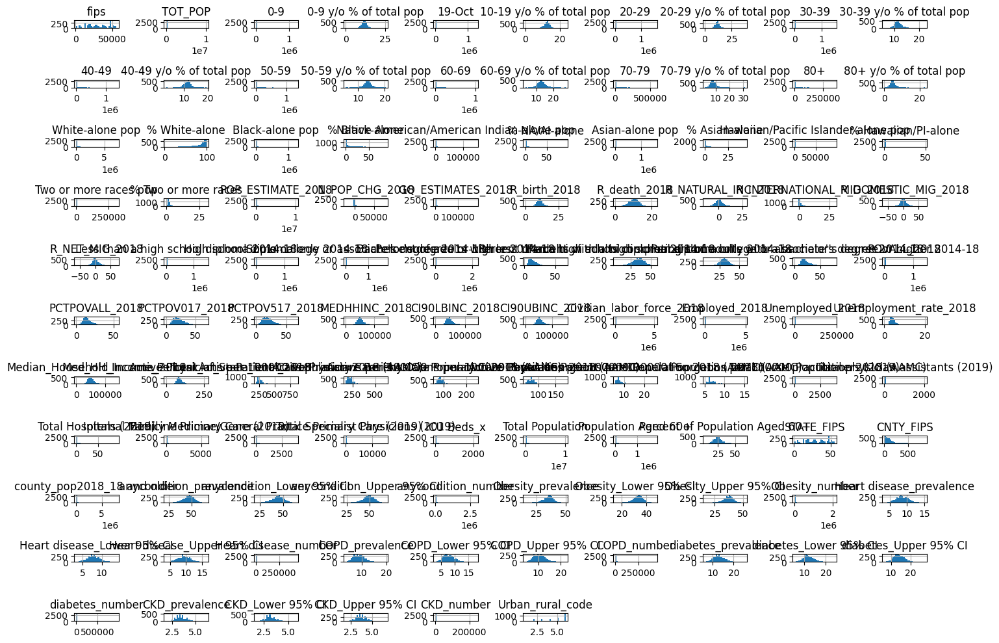

In [10]:
# Detectar columnas numéricas
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()

# Generar histogramas para las columnas numéricas
df[numeric_cols].hist(figsize=(14, 10), bins=30)
plt.tight_layout()
plt.show()


b) Countplot para algunas variables categóricas

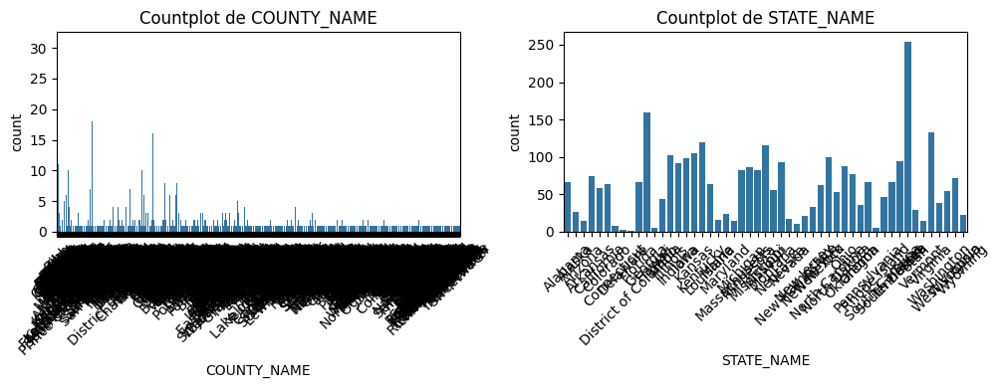

In [11]:
# Selecciona las columnas categóricas (tipo 'object')
categorical_cols = df.select_dtypes(include=['object']).columns

# Calcula el número de filas y columnas para los subplots
num_plots = len(categorical_cols)
ncols = 3
nrows = (num_plots + ncols - 1) // ncols  # Asegúrate de tener suficientes filas

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, nrows*4))
axes = axes.flatten()

for i, col in enumerate(categorical_cols):
    if i < len(axes):
        sns.countplot(data=df, x=col, ax=axes[i])
        axes[i].set_title(f"Countplot de {col}")
        axes[i].tick_params(axis='x', rotation=45)

# Oculta los ejes no utilizados
for j in range(num_plots, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


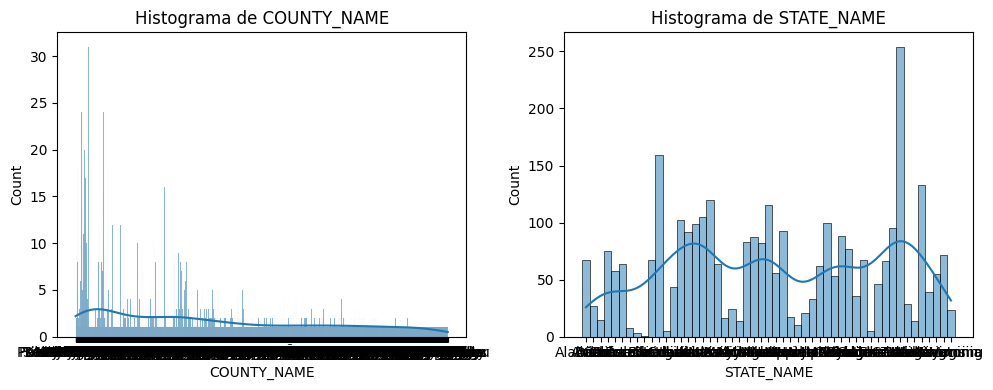

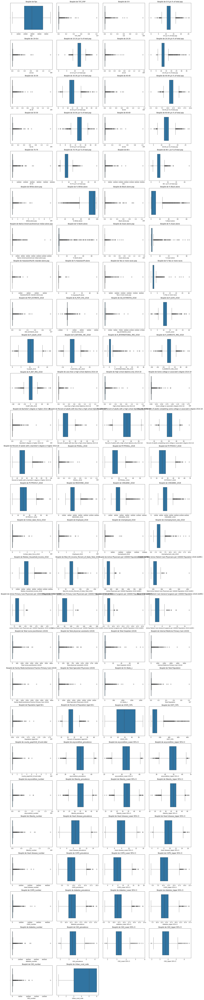

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt
import math

# Clasificar columnas según su tipo
categorical_cols = df.select_dtypes(include=['object', 'category']).columns
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns

# Definir función para gráficos en cuadrícula
def plot_grid(columns, plot_func, title, n_cols=3):
    n_rows = math.ceil(len(columns) / n_cols)  # Calcular número de filas
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
    axes = axes.flatten()  # Asegurar compatibilidad con iteración

    for i, col in enumerate(columns):
        plot_func(df, col, axes[i])  # Función para graficar
        axes[i].set_title(f"{title} de {col}")
    
    # Ocultar los ejes sobrantes (si hay más espacios que gráficos)
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])  # Eliminar subgráficos vacíos

    plt.tight_layout()
    plt.show()

# Crear funciones específicas para histogramas y boxplots
def hist_plot(data, column, ax):
    sns.histplot(data=data, x=column, kde=True, ax=ax)

def box_plot(data, column, ax):
    sns.boxplot(data=data, x=column, y=None, ax=ax)

# Graficar variables categóricas (histogramas)
plot_grid(categorical_cols, hist_plot, "Histograma", n_cols=3)

# Graficar variables numéricas (boxplots)
plot_grid(numerical_cols, box_plot, "Boxplot", n_cols=4)



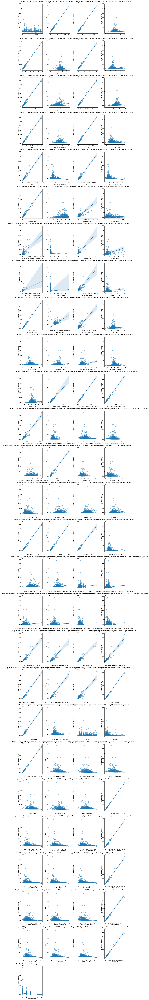

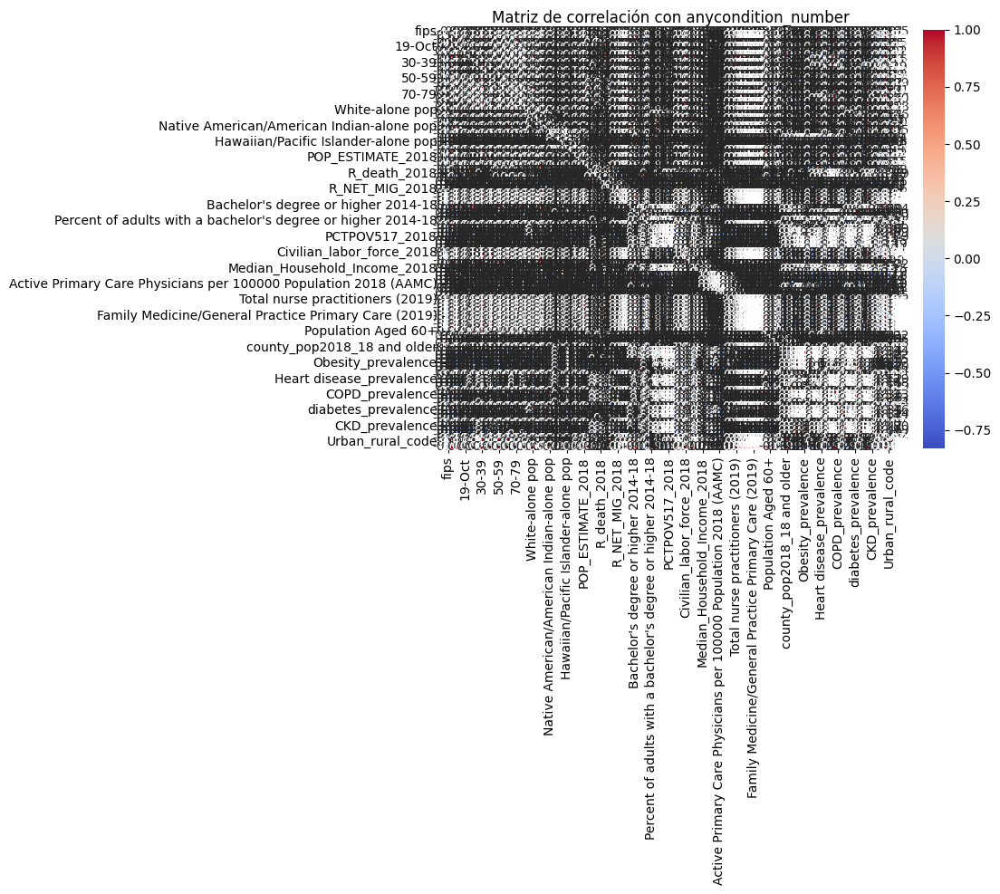

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Usar la columna 'anycondition_number' directamente
y_factorized = df['anycondition_number']

# Identificar columnas numéricas excluyendo 'anycondition_number'
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns.drop('anycondition_number')

# Configuración para subplots (4 gráficos por fila)
num_cols = 4
num_plots = len(numerical_cols)
num_rows = (num_plots + num_cols - 1) // num_cols  # Calcular filas necesarias

# Crear el espacio para subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))
axes = axes.flatten()  # Aplanar la matriz de ejes para iterar

# Iterar sobre cada columna y graficar
for i, col in enumerate(numerical_cols):
    sns.regplot(data=df, x=col, y='anycondition_number', ax=axes[i], scatter_kws={'alpha': 0.5})
    axes[i].set_title(f"Regplot: {col} vs anycondition_number")
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('anycondition_number')

# Eliminar ejes vacíos si hay menos gráficos que espacios creados
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Ajustar la distribución de los gráficos y mostrar
plt.tight_layout()
plt.show()

# Heatmap con correlaciones de todas las variables numéricas respecto a 'anycondition_number'
# Nos aseguramos de incluir 'anycondition_number' en el análisis
cols = list(numerical_cols) + ['anycondition_number']
correlation_matrix = df[cols].corr()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Matriz de correlación con anycondition_number")
plt.show()



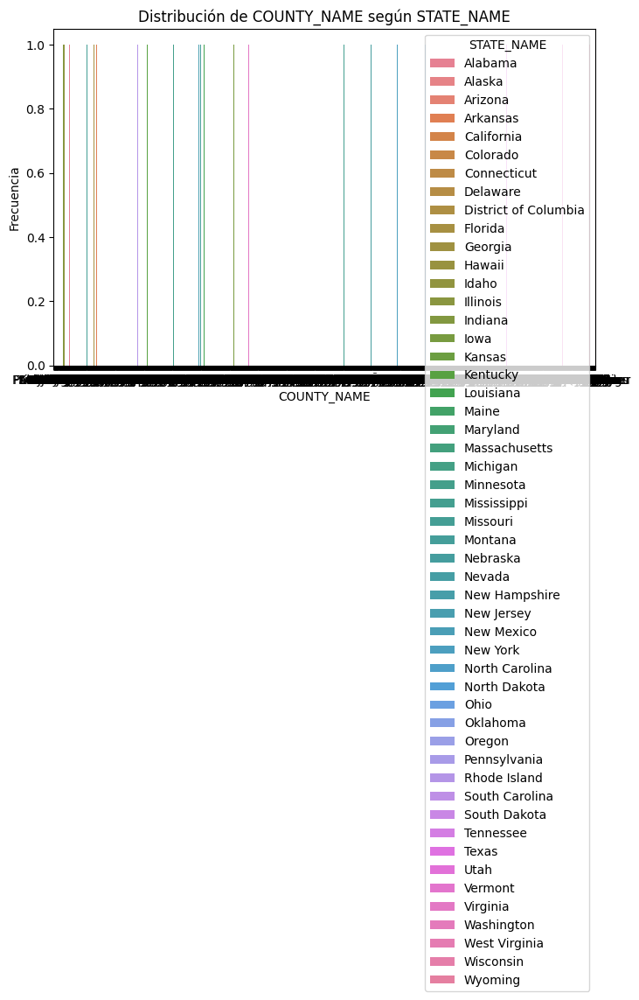

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt
import itertools  # Para hacer combinaciones de pares de variables categóricas

# Identificar columnas categóricas
categorical_cols = df.select_dtypes(include=['object']).columns

# Generar todas las combinaciones posibles de pares de variables categóricas
category_pairs = list(itertools.combinations(categorical_cols, 2))

# Crear subplots para cada combinación de variables categóricas
fig, axes = plt.subplots(len(category_pairs), 1, figsize=(8, 5 * len(category_pairs)))

# Si solo hay una pareja, convertir axes en lista para evitar errores de indexación
if len(category_pairs) == 1:
    axes = [axes]

# Graficar cada combinación de variables categóricas
for i, (cat1, cat2) in enumerate(category_pairs):
    sns.countplot(data=df, x=cat1, hue=cat2, ax=axes[i])
    axes[i].set_title(f"Distribución de {cat1} según {cat2}")
    axes[i].set_xlabel(cat1)
    axes[i].set_ylabel("Frecuencia")

# Ajustar el diseño para evitar solapamientos
plt.tight_layout()
plt.show()



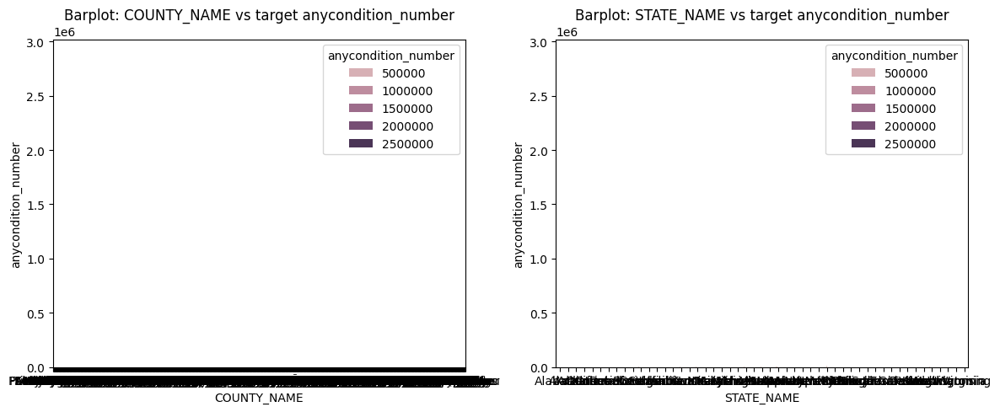

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

# Identificar columnas categóricas
categorical_cols = df.select_dtypes(include=['object']).columns

# Definir una columna para segmentar (puedes cambiarlo según tu dataset)
hue_col = 'anycondition_number'  # Cámbialo por otra variable categórica si prefieres

# Crear la figura con subplots
fig, axes = plt.subplots(1, len(categorical_cols), figsize=(6 * len(categorical_cols), 5))

# Si solo hay una variable categórica, convertir axes en una lista para evitar errores
if len(categorical_cols) == 1:
    axes = [axes]

# Graficar cada variable categórica con un hue adicional
for i, cat_col in enumerate(categorical_cols):
    if cat_col != hue_col:  # Evitar usar la misma variable en X y en hue
        sns.barplot(data=df, x=cat_col, y='anycondition_number', hue=hue_col, ax=axes[i], estimator='mean', ci=None)
        axes[i].set_title(f"Barplot: {cat_col} vs target {hue_col}")
        axes[i].set_xlabel(cat_col)
        axes[i].set_ylabel("anycondition_number")

# Ajustar el diseño
plt.tight_layout()
plt.show()


In [21]:
import pandas as pd
import json

def factorize_all_categoricals(df, save_json=True, json_filename="categorical_transformation_rules.json"):
    """
    Detecta todas las columnas categóricas en el DataFrame, las factoriza y guarda
    el mapeo de transformación (valor original a código numérico) en un archivo JSON.
    
    Se crea una nueva columna para cada columna categórica con el sufijo "_n".
    
    Parameters:
      df (pd.DataFrame): DataFrame de entrada.
      save_json (bool): Si True, guarda el mapeo en un archivo JSON.
      json_filename (str): Nombre del archivo JSON para guardar el mapeo.
      
    Returns:
      df (pd.DataFrame): DataFrame modificado con columnas factorizadas.
      transformation_rules (dict): Diccionario con el mapeo de cada columna categórica.
    """
    # Detectar columnas categóricas
    cat_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
    transformation_rules = {}
    
    for col in cat_cols:
        # Factorizar la columna
        codes, uniques = pd.factorize(df[col])
        df[col + "_n"] = codes  # Nueva columna con los códigos
        
        # Crear el mapeo: {valor_original: código}
        mapping = {value: code for code, value in enumerate(uniques)}
        transformation_rules[col] = mapping

    # Guardar el mapeo en un archivo JSON si se desea
    if save_json:
        with open(json_filename, "w") as f:
            json.dump(transformation_rules, f, indent=4)
        print(f"Transformation rules saved in {json_filename}")

    return df, transformation_rules

# Ejemplo de uso:
# Supongamos que ya tienes un DataFrame "df"
df, transformation_rules = factorize_all_categoricals(df)

Transformation rules saved in categorical_transformation_rules.json


Correlación (Heatmap) de las variables numéricas y categoricas

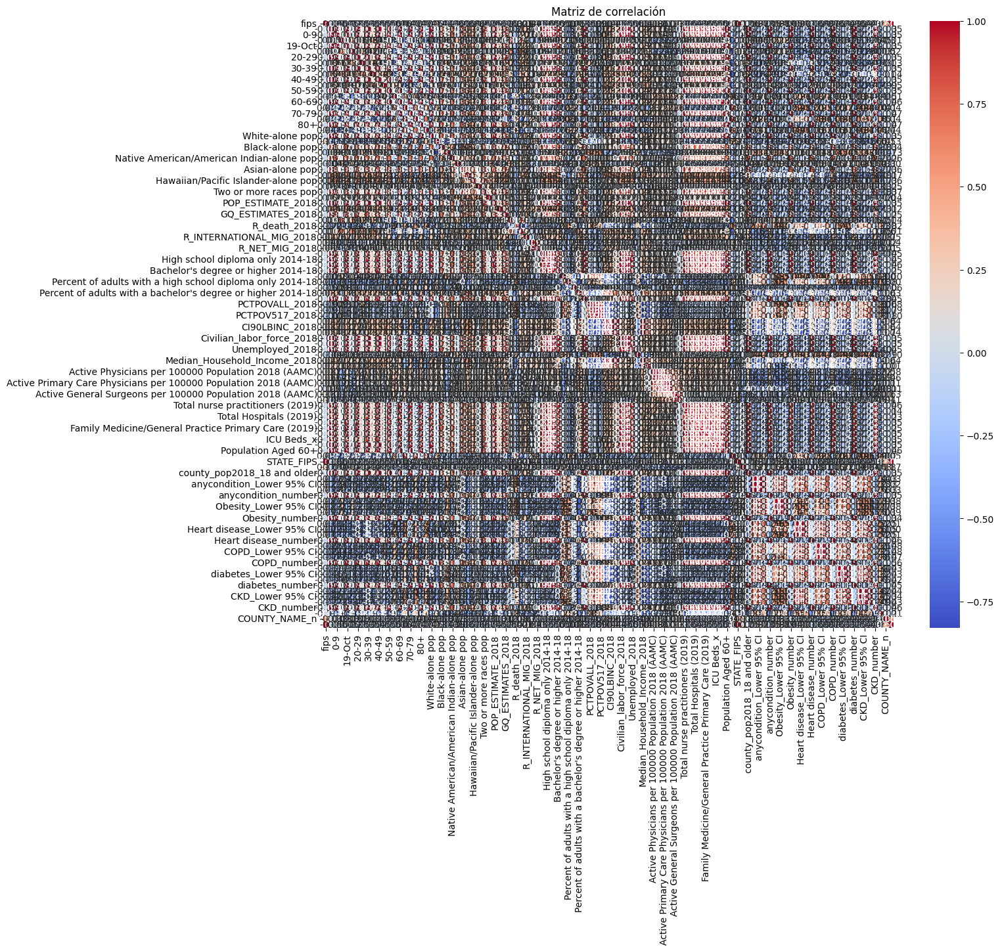

In [23]:
# Ruta al archivo JSON con las reglas de factorización
json_file_path = "/workspaces/regularized_mod_regresion_lineal/src/categorical_transformation_rules.json"

# Cargar el archivo JSON
with open(json_file_path, 'r') as file:
    factorization_rules = json.load(file)

# Aplicar la factorización a las columnas categóricas según las reglas del archivo JSON
for col, mapping in factorization_rules.items():
    df[col + "_n"] = df[col].map(mapping)

# Seleccionar todas las columnas numéricas en el DataFrame
numeric_cols = df.select_dtypes(include=['number']).columns

# Crear la matriz de correlación
corr_matrix = df[numeric_cols].corr()

# Graficar la matriz de correlación
plt.figure(figsize=(14, 12))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Matriz de correlación")
plt.show()


In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3140 entries, 0 to 3139
Columns: 110 entries, fips to STATE_NAME_n
dtypes: float64(61), int64(47), object(2)
memory usage: 2.6+ MB


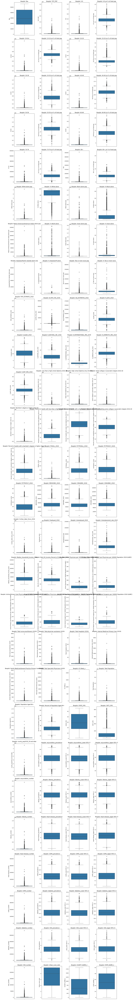

In [25]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
 
# Filtrar las columnas de tipo float64 e int64
numerical_columns = df.select_dtypes(include=['float64', 'int64'])
 
# Configuración para subplots (3 gráficos por fila)
num_cols = 4  # Número de gráficos por fila
num_plots = len(numerical_columns)  # Número total de gráficos
num_rows = (num_plots + num_cols - 1) // num_cols  # Calcular filas necesarias
 
# Crear el espacio para subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))  # Ajustar la figura
 
# Asegurarnos de que 'axes' sea una matriz plana para iterar fácilmente
axes = axes.flatten()
 
# Iterar sobre cada columna y graficar en el espacio asignado
for i, column in enumerate(numerical_columns):
   sns.boxplot(data=df, y=column, ax=axes[i])  # Cambiar 'x' por 'y' para orientación vertical
   axes[i].set_title(f"Boxplot: {column}")
 
# Eliminar ejes vacíos si hay menos gráficos que espacios
for j in range(i + 1, len(axes)):
   fig.delaxes(axes[j])
 
# Ajustar la distribución de los gráficos
plt.tight_layout()
plt.show()

Selección de variables (features)

In [26]:
import json
 
# Copiar el dataframe para trabajar con los datos con y sin outliers
df_con_outliers = df.copy()
df_sin_outliers = df.copy()
 
# Función para reemplazar los outliers de una columna en un dataframe
def replace_outliers_from_column(column, df):
   column_stats = df[column].describe()  # Calcular estadísticas de la columna
   column_iqr = column_stats["75%"] - column_stats["25%"]  # Rango intercuartílico (IQR)
   upper_limit = column_stats["75%"] + 1.5 * column_iqr  # Límite superior
   lower_limit = column_stats["25%"] - 1.5 * column_iqr  # Límite inferior
 
   # Reemplazar los outliers superiores por el límite superior
   df[column] = df[column].apply(lambda x: x if (x <= upper_limit) else upper_limit)
   # Reemplazar los outliers inferiores por el límite inferior
   df[column] = df[column].apply(lambda x: x if (x >= lower_limit) else lower_limit)
 
   # Devuelve el dataframe modificado y los límites de los outliers
   return df.copy(), [lower_limit, upper_limit]
 
# Filtrar solo las columnas numéricas (float64 e int64)
numerical_columns = df.select_dtypes(include=["float64", "int64"]).columns
 
# Diccionario para almacenar los límites de outliers para cada columna
outliers_dict = {}
 
# Aplicar la función a cada columna numérica
for column in numerical_columns:
   df_sin_outliers, limits_list = replace_outliers_from_column(column, df_sin_outliers)
   outliers_dict[column] = limits_list  # Guardar los límites en el diccionario
 
# Guardar los límites de los outliers en un archivo JSON
with open("outliers_replacement.json", "w") as f:
   json.dump(outliers_dict, f)
 
# Mostrar el diccionario con los límites de cada columna, línea por línea
print("Límites de outliers para cada columna:")
for key, value in outliers_dict.items():
   print(f"{key}: {value}")


Límites de outliers para cada columna:
fips: [np.float64(-22171.0), np.float64(85433.0)]
TOT_POP: [np.float64(-74461.375), np.float64(153337.625)]
0-9: [np.float64(-8944.25), np.float64(18321.75)]
0-9 y/o % of total pop: [np.float64(7.0588377662499955), np.float64(16.487640596250003)]
19-Oct: [np.float64(-9797.125), np.float64(19993.875)]
10-19 y/o % of total pop: [np.float64(8.697336139999999), np.float64(16.63644994)]
20-29: [np.float64(-10305.0), np.float64(20545.0)]
20-29 y/o % of total pop: [np.float64(6.468544207500002), np.float64(17.2104902675)]
30-39: [np.float64(-9389.5), np.float64(18936.5)]
30-39 y/o % of total pop: [np.float64(7.7642376849999994), np.float64(15.564463085000002)]
40-49: [np.float64(-9067.625), np.float64(18433.375)]
40-49 y/o % of total pop: [np.float64(8.133868276249999), np.float64(14.937412626250001)]
50-59: [np.float64(-10028.375), np.float64(20668.625)]
50-59 y/o % of total pop: [np.float64(10.202730187500004), np.float64(16.964945307499995)]
60-69: [n

In [27]:
df_sin_outliers

,fips,TOT_POP,0-9,0-9 y/o % of total pop,19-Oct,10-19 y/o % of total pop,20-29,20-29 y/o % of total pop,30-39,30-39 y/o % of total pop,...,diabetes_Lower 95% CI,diabetes_Upper 95% CI,diabetes_number,CKD_prevalence,CKD_Lower 95% CI,CKD_Upper 95% CI,CKD_number,Urban_rural_code,COUNTY_NAME_n,STATE_NAME_n
0,1001,55601.000,6787.00,12.206615,7637.000,13.735364,6878.0,12.370281,7089.0,12.749771,...,11.9,13.8,5462.0,3.1,2.9,3.3,1326.0,3,0,0
1,1003,153337.625,18321.75,11.355276,19993.875,12.344167,20545.0,10.814964,18936.5,11.564429,...,11.0,13.1,14916.5,3.2,3.0,3.5,3968.5,4,1,0
2,1005,24881.000,2732.00,10.980266,2960.000,11.896628,3268.0,13.134520,3201.0,12.865239,...,18.6,20.6,3870.0,4.5,4.2,4.8,887.0,6,2,0
3,1007,22400.000,2456.00,10.964286,2596.000,11.589286,3029.0,13.522321,3113.0,13.897321,...,13.2,14.9,2511.0,3.3,3.1,3.6,595.0,2,3,0
4,1009,57840.000,7095.00,12.266598,7570.000,13.087828,6742.0,11.656293,6884.0,11.901798,...,12.6,14.5,6017.0,3.4,3.2,3.7,1507.0,2,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3135,56037,43051.000,6104.00,14.178532,6326.000,14.694200,5359.0,12.448027,6577.0,15.277229,...,8.3,9.6,2834.0,2.6,2.4,2.8,821.0,5,1837,50
3136,56039,23081.000,2384.00,10.328842,2185.000,9.466661,2967.0,12.854729,4093.0,15.564463,...,6.5,8.0,1360.0,2.4,2.2,2.6,447.0,5,481,50
3137,56041,20299.000,3121.00,15.375142,3205.000,15.788955,2153.0,10.606434,2702.0,13.311001,...,9.5,11.2,1500.0,3.0,2.8,3.2,430.0,5,1838,50
3138,56043,7885.000,858.00,10.881420,1113.000,14.115409,715.0,9.067850,903.0,11.452124,...,10.3,12.1,686.0,3.4,3.2,3.7,207.0,6,1839,50


In [28]:
df_con_outliers.isnull().sum().sort_values(ascending=False)
df_sin_outliers.isnull().sum().sort_values(ascending=False)

fips                      0
TOT_POP                   0
0-9                       0
0-9 y/o % of total pop    0
19-Oct                    0
                         ..
CKD_Upper 95% CI          0
CKD_number                0
Urban_rural_code          0
COUNTY_NAME_n             0
STATE_NAME_n              0
Length: 110, dtype: int64

In [29]:
df.isnull().sum().sort_values(ascending=False) / len(df)

fips                      0.0
TOT_POP                   0.0
0-9                       0.0
0-9 y/o % of total pop    0.0
19-Oct                    0.0
                         ... 
CKD_Upper 95% CI          0.0
CKD_number                0.0
Urban_rural_code          0.0
COUNTY_NAME_n             0.0
STATE_NAME_n              0.0
Length: 110, dtype: float64

In [32]:
from sklearn.model_selection import train_test_split
import pandas as pd
import os
 
# Seleccionar automáticamente las columnas numéricas (float64 e int64)
num_variables = df.select_dtypes(include=["float64", "int64"]).columns.tolist()
 
# Eliminar 'anycondition_number' de las características
num_variables.remove("anycondition_number")  # Excluir la columna 'anycondition_number' del conjunto de variables
 
# Dividimos los datos en muestras de train y test
X_con_outliers = df_con_outliers[num_variables]  # Solo columnas numéricas (sin anycondition_number)
X_sin_outliers = df_sin_outliers[num_variables]  # Solo columnas numéricas (sin anycondition_number)
 
# Establecer 'anycondition_number' como la variable objetivo
y = df_con_outliers["anycondition_number"]  # 'anycondition_number' es ahora la variable objetivo
 
# Split (división) en conjunto de entrenamiento y prueba
X_train_con_outliers, X_test_con_outliers, y_train, y_test = train_test_split(
   X_con_outliers, y, test_size=0.2, random_state=42
)
X_train_sin_outliers, X_test_sin_outliers = train_test_split(
   X_sin_outliers, test_size=0.2, random_state=42
)

# Guardar los conjuntos de datos resultantes en archivos Excel
output_dir = "/workspaces/regularized_mod_regresion_lineal/data/processed/"  # Ruta especificada
 
# Asegurarse de que la carpeta de salida existe
os.makedirs(output_dir, exist_ok=True)
 
# Guardar en Excel
X_train_con_outliers.to_excel(f"{output_dir}X_train_con_outliers.xlsx", index=False)
X_train_sin_outliers.to_excel(f"{output_dir}X_train_sin_outliers.xlsx", index=False)
X_test_con_outliers.to_excel(f"{output_dir}X_test_con_outliers.xlsx", index=False)
X_test_sin_outliers.to_excel(f"{output_dir}X_test_sin_outliers.xlsx", index=False)
y_train.to_excel(f"{output_dir}y_train.xlsx", index=False)
y_test.to_excel(f"{output_dir}y_test.xlsx", index=False)
 
# Mostrar una vista previa del conjunto de datos con outliers
print("Vista previa de X_train_con_outliers:")
print(X_train_con_outliers.head())
 

Vista previa de X_train_con_outliers:
       fips  TOT_POP    0-9  0-9 y/o % of total pop  19-Oct  \
1292  26127    26625   3221               12.097653    3463   
2302  42121    51266   5272               10.283619    5751   
761   18133    37779   3915               10.362900    5118   
2194  40131    91984  11163               12.135806   12646   
1241  26025   134487  16698               12.416070   17666   

      10-19 y/o % of total pop  20-29  20-29 y/o % of total pop  30-39  \
1292                 13.006573   2922                 10.974648   2829   
2302                 11.217961   5137                 10.020286   5341   
761                  13.547209   6202                 16.416528   4363   
2194                 13.748043  11595                 12.605453  11357   
1241                 13.135842  17281                 12.849569  15993   

      30-39 y/o % of total pop  ...  diabetes_Lower 95% CI  \
1292                 10.625352  ...                   12.6   
2302          

In [33]:
from sklearn.preprocessing import StandardScaler

# Normalizamos el DataFrame con outliers y lo guardamos
scaler_con_outliers = StandardScaler()
scaler_con_outliers.fit(X_train_con_outliers)
 
X_train_con_outliers_norm = scaler_con_outliers.transform(X_train_con_outliers)
X_train_con_outliers_norm = pd.DataFrame(X_train_con_outliers_norm, index=X_train_con_outliers.index, columns=num_variables)
 
X_test_con_outliers_norm = scaler_con_outliers.transform(X_test_con_outliers)
X_test_con_outliers_norm = pd.DataFrame(X_test_con_outliers_norm, index=X_test_con_outliers.index, columns=num_variables)
 
# Guardar los datasets normalizados
output_dir = "/workspaces/regularized_mod_regresion_lineal/data/processed/"  # Ruta especificada
 
# Guardar en Excel
X_train_con_outliers_norm.to_excel(f"{output_dir}X_train_con_outliers_norm.xlsx", index=False)
X_test_con_outliers_norm.to_excel(f"{output_dir}X_test_con_outliers_norm.xlsx", index=False)
 
# Normalizamos el DataFrame sin outliers y lo guardamos
scaler_sin_outliers = StandardScaler()
scaler_sin_outliers.fit(X_train_sin_outliers)
 
X_train_sin_outliers_norm = scaler_sin_outliers.transform(X_train_sin_outliers)
X_train_sin_outliers_norm = pd.DataFrame(X_train_sin_outliers_norm, index=X_train_sin_outliers.index, columns=num_variables)
 
X_test_sin_outliers_norm = scaler_sin_outliers.transform(X_test_sin_outliers)
X_test_sin_outliers_norm = pd.DataFrame(X_test_sin_outliers_norm, index=X_test_sin_outliers.index, columns=num_variables)
 
# Guardar los datasets normalizados
X_train_sin_outliers_norm.to_excel(f"{output_dir}X_train_sin_outliers_norm.xlsx", index=False)
X_test_sin_outliers_norm.to_excel(f"{output_dir}X_test_sin_outliers_norm.xlsx", index=False)
 
# Mostrar una vista previa del conjunto de datos normalizado con outliers
print("Vista previa de X_train_con_outliers_norm:")
print(X_train_con_outliers_norm.head())

Vista previa de X_train_con_outliers_norm:
          fips   TOT_POP       0-9  0-9 y/o % of total pop    19-Oct  \
1292 -0.301633 -0.229763 -0.225393                0.102383 -0.231350   
2302  0.761573 -0.161280 -0.179851               -0.754597 -0.181109   
761  -0.833037 -0.198764 -0.209983               -0.717144 -0.195009   
2194  0.629287 -0.048115 -0.049041                0.120407 -0.029705   
1241 -0.308413  0.070012  0.073864                0.252809  0.080526   

      10-19 y/o % of total pop     20-29  20-29 y/o % of total pop     30-39  \
1292                  0.162374 -0.229775                 -0.429454 -0.223780   
2302                 -0.836073 -0.188375                 -0.736296 -0.176225   
761                   0.464170 -0.168470                  1.320194 -0.194740   
2194                  0.576280 -0.067671                  0.094875 -0.062335   
1241                  0.234535  0.038603                  0.173362  0.025430   

      30-39 y/o % of total pop  ...  diabet

In [34]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# Normalizamos el DataFrame con outliers utilizando MinMaxScaler y lo guardamos
scaler_con_outliers = MinMaxScaler()
scaler_con_outliers.fit(X_train_con_outliers)
 
X_train_con_outliers_scal = scaler_con_outliers.transform(X_train_con_outliers)
X_train_con_outliers_scal = pd.DataFrame(X_train_con_outliers_scal, index=X_train_con_outliers.index, columns=num_variables)
 
X_test_con_outliers_scal = scaler_con_outliers.transform(X_test_con_outliers)
X_test_con_outliers_scal = pd.DataFrame(X_test_con_outliers_scal, index=X_test_con_outliers.index, columns=num_variables)
 
# Guardar los datasets normalizados
output_dir = "/workspaces/regularized_mod_regresion_lineal/data/processed/"  # Ruta especificada
 
# Guardar en Excel
X_train_con_outliers_scal.to_excel(f"{output_dir}X_train_con_outliers_scal.xlsx", index=False)
X_test_con_outliers_scal.to_excel(f"{output_dir}X_test_con_outliers_scal.xlsx", index=False)
 
# Escalamos el DataFrame sin outliers utilizando StandardScaler y lo guardamos
scaler_sin_outliers = StandardScaler()
scaler_sin_outliers.fit(X_train_sin_outliers)
 
X_train_sin_outliers_scal = scaler_sin_outliers.transform(X_train_sin_outliers)
X_train_sin_outliers_scal = pd.DataFrame(X_train_sin_outliers_scal, index=X_train_sin_outliers.index, columns=num_variables)
 
X_test_sin_outliers_scal = scaler_sin_outliers.transform(X_test_sin_outliers)
X_test_sin_outliers_scal = pd.DataFrame(X_test_sin_outliers_scal, index=X_test_sin_outliers.index, columns=num_variables)
 
# Guardar los datasets normalizados
X_train_sin_outliers_scal.to_excel(f"{output_dir}X_train_sin_outliers_scal.xlsx", index=False)
X_test_sin_outliers_scal.to_excel(f"{output_dir}X_test_sin_outliers_scal.xlsx", index=False)
 
# Mostrar una vista previa del conjunto de datos escalados con outliers
print("Vista previa de X_train_con_outliers_scal:")
print(X_train_con_outliers_scal.head())

Vista previa de X_train_con_outliers_scal:
          fips   TOT_POP       0-9  0-9 y/o % of total pop    19-Oct  \
1292  0.456468  0.002626  0.002666                0.484236  0.002795   
2302  0.747057  0.005064  0.004363                0.411625  0.004641   
761   0.311228  0.003730  0.003240                0.414798  0.004130   
2194  0.710901  0.009094  0.009239                0.485763  0.010205   
1241  0.454615  0.013300  0.013820                0.496981  0.014257   

      10-19 y/o % of total pop     20-29  20-29 y/o % of total pop     30-39  \
1292                  0.558117  0.001877                  0.316717  0.001876   
2302                  0.481367  0.003299                  0.289175  0.003549   
761                   0.581316  0.003983                  0.473765  0.002898   
2194                  0.589934  0.007447                  0.363781  0.007555   
1241                  0.563664  0.011098                  0.370826  0.010642   

      30-39 y/o % of total pop  ...  diabet

In [37]:
from sklearn.feature_selection import f_regression, SelectKBest
import pandas as pd

# Con un valor de k = 5 se seleccionan las 5 mejores características
# Cambiamos f_classif por f_regression ya que trabajamos con regresión
selection_model = SelectKBest(f_regression, k=5)
 
# Ajustamos el modelo de selección de características
selection_model.fit(X_train_con_outliers, y_train)
 
# Obtenemos el soporte de las características seleccionadas
ix = selection_model.get_support()
 
# Transformar los conjuntos de datos
X_train_sel = pd.DataFrame(selection_model.transform(X_train_con_outliers), columns=X_train_con_outliers.columns[ix])
X_test_sel = pd.DataFrame(selection_model.transform(X_test_con_outliers), columns=X_test_con_outliers.columns[ix])
 
# Vista previa de los conjuntos de datos seleccionados
print("Características seleccionadas - Conjunto de entrenamiento:")
print(X_train_sel.head())
 
print("Características seleccionadas - Conjunto de prueba:")
print(X_test_sel.head())
 
# Agregamos la variable objetivo al conjunto de datos seleccionados
X_train_sel["anycondition_number"] = list(y_train)
X_test_sel["anycondition_number"] = list(y_test)
 
# Guardamos los conjuntos de datos en archivos CSV
output_dir = "/workspaces/regularized_mod_regresion_lineal/data/processed/"  # Ruta especificada
 
X_train_sel.to_csv(f"{output_dir}clean_train_data.csv", index=False)
X_test_sel.to_csv(f"{output_dir}clean_test_data.csv", index=False)

Características seleccionadas - Conjunto de entrenamiento:
    TOT_POP  POP_ESTIMATE_2018  Obesity_number  Heart disease_number  \
0   26625.0            26625.0          7930.0                2072.0   
1   51266.0            51266.0         13713.0                3796.0   
2   37779.0            37779.0         10238.0                2222.0   
3   91984.0            91984.0         25735.0                5484.0   
4  134487.0           134487.0         38882.0                8686.0   

   CKD_number  
0       771.0  
1      1454.0  
2       871.0  
3      2118.0  
4      3490.0  
Características seleccionadas - Conjunto de prueba:
    TOT_POP  POP_ESTIMATE_2018  Obesity_number  Heart disease_number  \
0    9038.0             9038.0          2769.0                 698.0   
1  269805.0           269805.0         63722.0               13982.0   
2   17408.0            17408.0          5927.0                1768.0   
3  117327.0           117327.0         27220.0                6739.0   
